In [2]:
import BioNick as bn
import numpy as np
import pandas as pd
from Bio import SeqIO
import matplotlib.pyplot as plt

In [3]:
def export_block(mt,i,i2):
    t1,t2 = mt.loc[i:,['gi','gi+1','Sequence','Sq+1']],mt.loc[i2:,['gi','gi+1','Sequence','Sq+1']] 
    t1 = t1.iloc[:t2.shape[0],:] #truncate t1
    t1,t2 = t1.reset_index(drop = 1), t2.reset_index(drop = 1)
    b = []
    for t1g1,t1g1p1,t1s1,t1s1p1, t2g1,t2g1p1,t2s1,t2s1p1 in pd.concat([t1,t2], axis = 1).values:
        if (t1g1 == t2g1) and (t1g1p1 == t2g1p1) and (t1s1 == t1s1p1) and (t2s1 == t2s1p1):
            b.append(t1g1)
        else:
            b.append(t1g1)
            break
    return b

def eb_rev(mt,mu,i,i2):
    t1,t2 = mt.loc[i:,['gi','gi+1','Sequence','Sq+1']],mu.loc[:i2,['gi','gi-1','Sequence','Sq-1']][::-1]
    m = min(t1.shape[0],t2.shape[0])
    t1,t2 = t1.iloc[:m,:],t2.iloc[:m,:] #truncate
    t1,t2 = t1.reset_index(drop = 1), t2.reset_index(drop = 1)
    b = []
    for t1g1,t1g1p1,t1s1,t1s1p1, t2g1,t2g1m1,t2s1,t2s1m1 in pd.concat([t1,t2], axis = 1).values:
        if (t1g1 == t2g1) and (t1g1p1 == t2g1m1) and (t1s1 == t1s1p1) and (t2s1 == t2s1m1):
            b.append(t1g1)
        else:
            b.append(t1g1)
            break
    return b

def prep(d1):
    d1 = d1[(d1['Status'] == 'Single') | (d1['Status'] == 'Duplicated')]
    gi = d1.sort_values(['Sequence', 'Gene Start']).drop_duplicates('Gene')['Gene'].reset_index(drop=1).reset_index()
    d1 = d1.sort_values(['Sequence', 'Gene Start'])
    if 'index' in d1.columns:
        d1 = pd.merge(d1.drop('index', axis = 1),gi, how = 'left')
        gii = pd.merge(d1.drop('index', axis = 1),gi, how = 'left')['index']
    else:
        d1 = pd.merge(d1,gi, how = 'left')
        gii = pd.merge(d1,gi, how = 'left')['index']
    d1['gi'] = gii
    d1["Sq+1"] = d1['Sequence'].shift(-1)
    d1["gi+1"] = d1['gi'].shift(-1)
    d1["Sq-1"] = d1['Sequence'].shift(1)
    d1["gi-1"] = d1['gi'].shift(1)
    d1['index'] = d1.index
    return d1

def prep2(d1):
    d1 = d1[(d1['Status'] == 'Single') | (d1['Status'] == 'Duplicated')]
    gi = d1.sort_values(['Sequence', 'Gene Start']).drop_duplicates('Gene')['Gene'].reset_index(drop=1).reset_index()
    #d1 = d1.sort_values(['Sequence', 'Gene Start'])
    d1 = pd.merge(d1.drop('index', axis = 1),gi, how = 'left')
    gii = pd.merge(d1.drop('index', axis = 1),gi, how = 'left')['index']
    d1['gi'] = gii
    d1["Sq+1"] = d1['Sequence'].shift(-1)
    d1["gi+1"] = d1['gi'].shift(-1)
    d1["Sq-1"] = d1['Sequence'].shift(1)
    d1["gi-1"] = d1['gi'].shift(1)
    d1['index'] = d1.index
    return d1

def itr(d1):

    mt = d1[['index', 'Sequence', 'gi', 'Sq+1', 'gi+1']]
    mu = d1[['index', 'Sequence', 'gi', 'Sq-1', 'gi-1']]

    hs = [False] * mt.shape[0]
    t = []
    for i,sq,gi,sq_p1,gi_p1 in mt.values:
        if hs[i]:
            continue
        for i2,sq2,gi2,sq_p12,gi_p12 in mt.loc[i+1:,:].values: #the second hash makes i+1 redundant
            if hs[i2]:
                continue
            if (gi == gi2) and (gi_p1 == gi_p12) and (sq == sq_p1) and (sq2 == sq_p12): #match pair
                #export block
                b = export_block(mt,i,i2)
                #hs[i:i+len(b)] = [True]*len(b) #this would prevent protrusions.
                hs[i2:i2+len(b)] = [True]*len(b)
                hs[i] = [True] #block is defined by first gene. this allows protrusions, i.e., a longer match block on iter 2 after a shorter one.
                #hs[i2] = [True] #this isn't necessary, because the match block can't protrude.
                t.append(('+',i,i2,b,len(b)))

    #reverse
    hs = [False] * mt.shape[0]
    hsr = [False] * mu.shape[0] #might not be possible without two hashes
    for i,sq,gi,sq_p1,gi_p1 in mt.values:
        if hs[i] or hsr[i]: #not absolutely sure.
            continue
        for i2,sq2,gi2,sq_m12,gi_m12 in mu.values:
            if hsr[i2] or hs[i2]:
                continue
            if (gi == gi2) and (gi_p1 == gi_m12) and (sq == sq_p1) and (sq2 == sq_m12): #reverse match pair
                b = eb_rev(mt,mu,i,i2)
                if abs(i2-i) == len(b)-1: #palindromes #placed before hash to allow internal blocks
                    continue
                #hs[i:i+len(b)] = [True]*len(b)
                #hs[i2-len(b):(i2-len(b))+len(b)] = [True]*len(b)
                hs[i] = [True]
                hs[i2-len(b) : i2] = [True]*len(b) 
                hsr[i:i+len(b)] = [True]*len(b)
                hsr[i2] = [True]
                t.append(('-',i,i2,b,len(b)))
                
    return pd.DataFrame(t)

#remove confined subblocks in either orientation
def clear_confined(df): #n2 iter. repeated indexing. slow.
    t = []
    for i,r in df[df[4] > 2].sort_values(4, ascending = 0).iterrows():
        if r[0] == '-':
            l1,l2 = list(range(r[1],r[1]+r[4])), list(range(r[2]-r[4]+1, r[2]+1))
        else:
            l1,l2 = list(range(r[1],r[1]+r[4])), list(range(r[2], r[2]+r[4]))

        for i2,r2 in df[df[4] <= r[4]].iterrows():

            if r2[0] == '-':
                a1 = min(r2[1],r2[1]+r2[4]-1,r2[2],r2[2]-r2[4]+1)
                a2 = max(r2[1],r2[1]+r2[4]-1,r2[2],r2[2]-r2[4]+1)
            else:
                a1 = min(r2[1],r2[1]+r2[4]-1,r2[2],r2[2]+r2[4]-1)
                a2 = max(r2[1],r2[1]+r2[4]-1,r2[2],r2[2]+r2[4]-1)

            if ((a1 in l1) and (a2 in l1)) or ((a1 in l2) and (a2 in l2)):
                t.append(i2)
    return df.drop(t)

def reformat_reverse(tf1):
    tf1.loc[tf1[0] == '-', 2] = tf1.loc[tf1[0] == '-'][2] - tf1.loc[tf1[0] == '-'][4] + 1
    tf1.loc[:,7] = tf1.loc[:,1]
    tf1.loc[tf1[1] > tf1[2], 3] = tf1.loc[tf1[1] > tf1[2], 3].apply(lambda x: x[::-1])
    tf1.loc[tf1[7] > tf1[2], 1] = tf1.loc[tf1[7] > tf1[2], 2]
    tf1.loc[tf1[7] > tf1[2], 2] = tf1.loc[tf1[7] > tf1[2], 7]
    tf1[5] = tf1[1]+tf1[4]-1
    tf1[6] = tf1[2]+tf1[4]-1
    tf1 = tf1.loc[tf1.astype(str).drop_duplicates([2,3]).index,] #[a,a,a,..] structures creating overlaps
    return tf1

def clear_localized_subblocks(df): #n2 iter. repeated indexing. slow.
    t = []
    for i,r in df.iterrows():
        for i2,r2 in df[df[4] < r[4]].iterrows():
            if r[1] <= r2[1] and r[2] <= r2[2] and r[5] >= r2[5] and r[6] >= r2[6]:
                t.append(i2)    
    return df.drop(t)

def self_overlaps(tf1):
    #return tf1[(tf1[6]-tf1[5]) < tf1[4]] #method 1 
    return tf1[(tf1[2] >= tf1[1]) & (tf1[2] <= tf1[5])] #method 2

def clear_self_overlaps(tf1):
    return tf1[~((tf1[2] >= tf1[1]) & (tf1[2] <= tf1[5]))]

def simple_stack(d1,tf1):
    t1 = pd.DataFrame({0: prep(d1)['Sequence'], 1 : range(len(d1))})
    w = [2]*len(d1)
    for i,r in tf1.sort_values([4,2],ascending=[0,1]).iterrows():

        x = max(w[r[1]:r[1]+r[4]])   
        if r[0] == '+':
            t1.loc[range(r[1],r[1]+r[4]),x] = range(r[2],r[2]+r[4])
            for i2 in range(r[1],r[1]+r[4]):
                w[i2] = x+1
        else:
            t1.loc[range(r[1],r[1]+r[4]),x] = range(r[2],r[2]+r[4])[::-1]
            for i2 in range(r[1],r[1]+r[4]):
                w[i2] = x+1
                
    r1 = set(t1.loc[:,2:].values.flatten()[t1.loc[:,2:].values.flatten() > 0]) #entries that appear as stacks
    r2 = set(t1[t1.loc[:,2:].sum(axis = 1) == 0].index) #entries not having any stacks
    t2 = t1.loc[~t1.index.isin(r1.intersection(r2)),:]
    return [t1, t2]

def map_genes(d1, t2):
    t = {-1:-1}
    for i,r in prep(d1).iterrows():
        t[i] = r['gi']
    return t2.fillna(-1).applymap(lambda x: t[x]).replace(-1,np.nan)

def map_column(d1, t2, column):
    t = {-1:-1}
    for i,r in d1.iterrows(): #changed
        t[i] = r[column]
    return t2.fillna(-1).applymap(lambda x: t[x]).replace(-1,np.nan)

def demarcate(t1b):
    #demarcate protrusion grids universally. 
    t1bm1 = t1b.shift(-1)
    t,t1 = [],[]
    for i in range(len(t1b)):
        if sum(abs(t1bm1.iloc[i,2:] - t1b.iloc[i,2:]) == 1) != 0:
            #start
            t1.append(i)
        else:
            if len(t1)!= 0:
                t1.append(i)
                t.append(t1)
                t1 = []
    t2 = []
    t1b[t1b.shape[1]] = np.nan
    for i in t:
        t1b.iloc[i,-1] = t.index(i)
    return t1b

def extract_blocks_from_grid(grid):
    #[(column, start_index, end_index, start_entry, end_entry, elements, length)]
    t = []
    for ci in grid.columns:
        starts = grid.loc[:,ci].dropna().loc[abs(grid.loc[:,ci].dropna() - grid.loc[:,ci].dropna().shift(1)) != 1]
        ends = grid.loc[:,ci].dropna().loc[abs(grid.loc[:,ci].dropna() - grid.loc[:,ci].dropna().shift(-1)) != 1]
        for si,ei,se,ee in zip(starts.index, ends.index, starts.values, ends.values):
            t.append((ci, si, ei, se, ee, list(range(int(se),int(ee)+1)), ei-si+1))
    return t

def compare_grids(source_grid, destination_grid):
    ap = (0,0,0,0)
    for c1 in source_grid.dropna(axis = 1, thresh = 1).columns:
        for c2 in destination_grid.dropna(axis = 1, thresh = 1).columns:
            si,ml = compare_columns(source_grid[c1], destination_grid[c2])
            if ml > ap[3]:
                ap = (c1,c2,si,ml)
        #t.append(ap)
    return ap #[(col1, col2, source_index, best_match_length)]
def compare_columns(column1, column2):
    sw = False
    if len(column1) < len(column2):
        sw = True
        t = column1#.reset_index(drop = 1)
        column1 = column2#.reset_index(drop = 1)
        column2 = t  
    mx = (0,0)
    for os in range(-len(column2),len(column1)):
        if sum(column1.shift(-os).iloc[:len(column2)].reset_index(drop = 1) == column2.reset_index(drop = 1)) >= mx[1]:
            mx = (os, sum(column1.shift(-os).iloc[:len(column2)].reset_index(drop = 1) == column2.reset_index(drop = 1)))
    if sw:
        return (-mx[0],mx[1]) #negative offset
    else:
        return mx

In [4]:
def incol(df): #logic error. gets lost. move end condition after filtering
    df2 = itr(prep(df))
    if len(df2) == 0:
        return prep(df)
    else:
        df2 = clear_self_overlaps(clear_localized_subblocks(reformat_reverse(clear_confined(df2))))
        if len(df2) == 0:
            return prep(df)
    dfu, dfc = simple_stack(prep(df),df2)
    return incol(prep(prep(df).loc[dfc.index]))

In [5]:
gl1,gl2 = [],[]
for gr in t1b[14].dropna().unique()[::-1]:
    m = set(t1b[t1b[14] == gr].loc[:,1:13].values.flatten()).intersection(set(vc2)) #matches #this test is not exclusive to source grids
    if len(m) != 0:
        gl1.append(gr)
    else:
        gl2.append(gr)
        
t1b[100] = t1b[14].copy()

NameError: name 't1b' is not defined

In [60]:
b1 = pd.read_csv('s1/GCA_001623345.3_sativa_indica/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A sativa
b2 = pd.read_csv('s1/GCA_000147395.3_glaberrima/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A glaberrima
b3 = pd.read_csv('s1/GCA_000182155.4_barthi/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A barthii
b4 = pd.read_csv('s1/GCA_000576495.2_glumi/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A glumipatula
b5 = pd.read_csv('s1/GCA_009805545.1_longistaminata/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A longistaminata
#b5 = pd.read_csv('s1/OL/viridiplantae_odb10/full_table.tsv', sep = '\t')
b6 = pd.read_csv('s1/GCA_000338895.3_merid/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A meridionalis
b7 = pd.read_csv('s1/GCA_000576065.2_nivara/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A nivara
b8 = pd.read_csv('s1/GCA_023541355.1_rufi/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A rufipogon
b9 = pd.read_csv('s1/GCA_000573905.2_punctata/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #B punctata
b10 = pd.read_csv('s1/GCA_008326285.1_officinalis/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #C officinalis
b11 = pd.read_csv('s1/oa/mc/viridiplantae_odb10/full_table.tsv', sep = '\t') #C alta
b12 = pd.read_csv('s1/oa/md/viridiplantae_odb10/full_table.tsv', sep = '\t') #D alta
b13 = pd.read_csv('s1/GCA_019925245.2_aus/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #E australiensis
b14 = pd.read_csv('s1/GCA_000231095.3_brach/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #F brachyantha
b15 = pd.read_csv('s1/oc/mk/viridiplantae_odb10/full_table.tsv', sep = '\t') #K coarctata
b16 = pd.read_csv('s1/oc/ml/viridiplantae_odb10/full_table.tsv', sep = '\t') #L coarctata
b17 = pd.read_csv('s1/GCA_005223365.2_meyeriana/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #G meyeriana
b18 = pd.read_csv('s1/GCA_000325765.3_leersia_per/GCA_000325765.3.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #OG leersia
#b19 = pd.read_csv('s1/GCA_000147395.3_glaberrima/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #FOG Zizania

In [61]:
b1['Genome'] = 'A'
b2['Genome'] = 'A'
b3['Genome'] = 'A'
b4['Genome'] = 'A'
b5['Genome'] = 'A'
b6['Genome'] = 'A'
b7['Genome'] = 'A'
b8['Genome'] = 'A'
b9['Genome'] = 'B'
b10['Genome'] = 'C'
b11['Genome'] = 'C'
b12['Genome'] = 'D'
b13['Genome'] = 'E'
b14['Genome'] = 'F'
b15['Genome'] = 'K'
b16['Genome'] = 'L'
b17['Genome'] = 'G'
b18['Genome'] = 'OG'

In [62]:
b1['Species'] = 'O.sativa'
b2['Species'] = 'O.glaberrima'
b3['Species'] = 'O.barthii'
b4['Species'] = 'O.glumipatula'
b5['Species'] = 'O.longistaminata'
b6['Species'] = 'O.meridionalis'
b7['Species'] = 'O.nivara'
b8['Species'] = 'O.rufipogon'
b9['Species'] = 'O.punctata'
b10['Species'] = 'O.officinalis'
b11['Species'] = 'O.alta'
b12['Species'] = 'O.alta'
b13['Species'] = 'O.australiensis'
b14['Species'] = 'O.brachyantha'
b15['Species'] = 'O.coarctata'
b16['Species'] = 'O.coarctata'
b17['Species'] = 'O.meyeriana'
b18['Species'] = 'L.perrieri'

In [63]:
a,b = simple_stack(prep(b10),clear_self_overlaps(clear_localized_subblocks(reformat_reverse(clear_confined(itr(prep(b1)))))))

In [64]:
b1 = incol(b1)
b2 = incol(b2)
b3 = incol(b3)
b4 = incol(b4)
b5 = incol(b5)
b6 = incol(b6)
b7 = incol(b7)
b8 = incol(b8)
b9 = incol(b9)
b10 = incol(b10)
b11 = incol(b11)
b12 = incol(b12)
b13 = incol(b13)
b14 = incol(b14)
b15 = incol(b15)
b16 = incol(b16)
b17 = incol(b17)
b18 = incol(b18)

In [65]:
bn = pd.concat([b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14,b15,b16,b17,b18],axis = 0).reset_index(drop = 1)
bn['index'] = bn.index

In [66]:
bn['GS'] = bn['Genome']+ '_' + bn['Species']

In [67]:
bn2 = prep2(bn)

In [13]:
def chrom_map(bn2):
    t = []
    tmp = []
    chc = 1
    for i in bn2[bn2['GS'] == 'A_O.sativa']['Sequence'].unique():
        td = bn2[bn2['Sequence'] == i]
        g1 = td['GS'].iloc[0]
        ch = 'Chr'+str(chc).zfill(2)
        for i2 in bn2['GS'].unique():
    #         if i2 == g1:
    #             continue
            td2 = bn2[bn2['GS'] == i2]
            c=0
            m=''
            g=''
            for i3 in td2['Sequence'].unique():
    #             if (i == i3):
    #                 continue
                td3 = td2[td2['Sequence'] == i3]
                if (len(set(td3['gi']).intersection(set(td['gi']))) > c) and (i3 not in tmp):
                    g = i2
                    m = i3
                    c = len(set(td3['gi']).intersection(set(td['gi'])))
            tmp.append(m)
            t.append((ch,i,g,m,c))
        chc+=1
    return pd.DataFrame(t)

In [68]:
cl = chrom_map(bn2)#.drop_duplicates()#.to_clipboard()

In [69]:
bn2 = pd.merge(bn2,cl[[0,3,4]],left_on='Sequence',right_on=3,how='left')

In [ ]:
#Nick

In [16]:
ot3 = '(A_O.barthii:0.0325512573,A_O.glaberrima:0.0056940523,((A_O.glumipatula:0.0401608695,(A_O.nivara:0.0346565848,(A_O.rufipogon:0.0411795604,A_O.sativa:0.0301924189):0.0284402228):0.0323505178):0.0200156546,(A_O.longistaminata:0.1127757986,(A_O.meridionalis:0.0875051396,(B_O.punctata:0.2529496003,((C._O.officinalis:0.1047551159,C_O.alta:0.1330927706):0.1037606366,((D_O.alta:0.1511713377,E._O.australiensis:0.1701048395):0.1008659242,((((F_O.brachyantha:0.5315096471,L_O.coarctata:0.5666269508):0.0776985949,G._O.meyeriana:0.3228603372):0.0301997193,OG._L.perrieri:0.7032677522):0.1049328290,K_O.coarctata:0.4641021210):0.1068868540):0.0566658542):0.0383235735):0.1652521682):0.0176331305):0.0363126934):0.0357345942)'

In [16]:
ot3p = '(((((((((A_O.barthii:0.03145305,A_O.glaberrima:0.0144516466):0.1051061965,(((A_O.nivara:0.0862779411,A_O.rufipogon:0.0909135824):0.0460473955,A_O.sativa:0.0517492865):0.0478610289,A_O.glumipatula:0.0676280531):0.0308455211):0.0884660871,A_O.meridionalis:0.2207132138):0.0340815961,A_O.longistaminata:0.3078478817):0.1376733007,B_O.punctata:0.5831655335):0.0595278699,(C_O.officinalis:0.2472903311,C_O.alta:0.1290280419):0.1625273656):0.0501359114,(D_O.alta:0.3637278127,E_O.australiensis:0.3071840498):0.1767515873):0.1505182909,K_O.coarctata:0.5368923197):0.1287419827,((L_O.coarctata:0.7585975259,G_O.meyeriana:0.6261505728):0.0964593819,F_O.brachyantha:0.7566290406):0.0942990504,OG_L.perrieri:0.9907828361)'

In [76]:
#manually rearranged
ot3p = '((((((((((A_O.sativa:0.0517492865,(A_O.nivara:0.0862779411,A_O.rufipogon:0.0909135824):0.0460473955):0.0478610289,A_O.glumipatula:0.0676280531):0.0308455211,(A_O.barthii:0.03145305,A_O.glaberrima:0.0144516466):0.1051061965):0.0884660871,A_O.meridionalis:0.2207132138):0.0340815961,A_O.longistaminata:0.3078478817):0.1376733007,B_O.punctata:0.5831655335):0.0595278699,(C_O.officinalis:0.2472903311,C_O.alta:0.1290280419):0.1625273656):0.0501359114,(D_O.alta:0.3637278127,E_O.australiensis:0.3071840498):0.1767515873):0.1505182909,K_O.coarctata:0.5368923197):0.1287419827,((L_O.coarctata:0.7585975259,G_O.meyeriana:0.6261505728):0.0964593819,F_O.brachyantha:0.7566290406):0.0942990504,OG_L.perrieri:0.9907828361)'

In [77]:
ot3pr = BioNick.flip_all_edges(ot3p)

In [18]:
#for vertical distancing of nodes. mean of first and last edge that go right from a node.
def mean_d(m,node,t1):
    sw = False
    for a,b,c in m.values:
        if (sw == False) and (a == node):
            sw = True
            s = t1[b]
        if sw and a != node:
            return (s+pb)/2
        pb = t1[b]
    return (s+pb)/2

#for vertical lines. first and last edge that go right from a node.
def ab(m,node,t1):
    sw = False
    for a,b,c in m.values:
        if (sw == False) and (a == node):
            sw = True
            s = t1[b]
        if sw and a != node:
            return [s,pb]
        pb = t1[b]
    return [s,pb]


#extract leaves
def leaves(nw):
    return [x.split(':')[0].replace('(','') for x in nw.split(',')]

#extract leaves with branch length
def leaves_wb(nw):
    return [x.split(')')[0].replace('(','') for x in nw.split(',')]

#make sure labels are unique. Append numbers if they are not
#assert len(leaves(bt)) == len(set(leaves(bt)))

#label leaves
def lale(nw):
    t = {}
    for i in leaves(nw):
        t[i] = leaves(nw).index(i)
    return t

#convert nw to tsv
def recur_nw_pd(bt,n,t): #,n = len(leaves(bt)),t = []): #default arguments cause trouble
    c = 0
    for i in bt:
        if i == '(':
            c+=1
        if i == ')':
            nt = bt.replace('('+bt.split('(')[c].split(')')[0]+')', '__'+str(n))
            for i2 in bt.split('(')[c].split(')')[0].split(','):
                t.append([n,i2.split(':')[0], float(i2.split(':')[1])])
            n+=1
            c-=1
            return recur_nw_pd(nt,n,t)
    return bt,t


#replace leaves with labels
def encode_leaves(bt,ab):
    #replace leaves with labels
    tb = ab
    ll = lale(bt)
    n = 0
    for a,b,c in tb:
        if b in ll.keys():
            tb[n][1] = ll[b]
        else:
            tb[n][1] = int(b.replace('__',''))
        n+=1
    return tb


#swap root node
def swap_root(tb,x):
    df = pd.DataFrame(tb)
    df2 = df.copy()
    while (x in df[1].unique()):
        #swap
        tmp = int(df.loc[df[1] == x, 0])
        df2.loc[df[1] == x, 0] = int(df2.loc[df[1] == x, 1])
        df2.loc[df[1] == x, 1] = tmp

        #print(tmp,x)
        x = tmp
    return df2


##convert tsv to newick.

#add 10 trailing decimals to the numbers.
def trail(df):
    t = []
    for a,b,c in df.values:
        if isinstance(a,int):
            na = '%016.10f' % a
        else:
            na = a
        if isinstance(b,int):
            nb = '%016.10f' % b
        else:
            nb = b
        t.append((na,nb,c))   
    return pd.DataFrame(t)

#reassign leaf names
def reasign(df2,bt):
    ll = lale(bt)
    inv = {v: k for k, v in ll.items()} #invert keys
    t = []
    for i in df2[1]:
        if i in inv.keys():
            t.append(inv[i])
        else:
            t.append(i)
    df2[1] = t

    df3 = df2.copy()
    
    return df3

def expand_node(df,node):
    tmp = df[df[0] == '%016.10f' % float(node)] #dependency on pandas.
    
    expanded_node = ''
    for a,b,c in tmp.values: #tmp.values when depends on pandas
        expanded_node = expanded_node+','+str(b)+':'+str(c)
    expanded_node = expanded_node[1:]
    return '(' + expanded_node + ')'

def recur_pd_nw(nt,df):
    #lvs = set(list(zip(*tb))[0]) #internal nodes
    int_nodes = df[0].astype(str).unique()
    for i in leaves(nt):
        if i in int_nodes:
            return recur_pd_nw(nt.replace(i,expand_node(df,i)),df)
    return nt    


#flip label order
def expand_node_flip(df,node):
    tmp = df[df[0] == '%016.10f'% float(node)] #dependency on pandas.
    expanded_node = ''
    for a,b,c in tmp.values: #tmp.values when depends on pandas
        expanded_node = str(b)+':'+str(c)+','+expanded_node
    expanded_node = expanded_node[:-1]
    return '(' + expanded_node + ')'
def recur_pd_nw_flip(nt,df):
    int_nodes = df[0].astype(str).unique()
    for i in leaves(nt):
        if i in int_nodes:
            return recur_pd_nw_flip(nt.replace(i,expand_node_flip(df,i)),df)
    return nt    

def flip_all_edges(tree):
    root_node,b = (recur_nw_pd(tree,len(leaves(tree)),[]))
    root_node = int(root_node.replace('__',''))
    tb = encode_leaves(tree,b)
    new = recur_pd_nw_flip('%016.10f' % root_node, trail(reasign(pd.DataFrame(tb),tree))) 
    return new

#flip specified node edges
def recur_pd_nw_flip_at_node(nt,df,node):
    int_nodes = df[0].astype(str).unique()
    for i in leaves(nt):
        if i in int_nodes:
            if i == str('%016.10f' % node):
                return recur_pd_nw_flip_at_node(nt.replace(i,expand_node_flip(df,i)),df,node)
            else:
                return recur_pd_nw_flip_at_node(nt.replace(i,expand_node(df,i)),df,node)  
    return nt   
def flip_leaves_at_node(tree,node):
    root_node,b = (recur_nw_pd(tree,len(leaves(tree)),[]))
    root_node = int(root_node.replace('__',''))
    tb = encode_leaves(tree,b)
    new = recur_pd_nw_flip_at_node('%016.10f' % root_node, trail(reasign(pd.DataFrame(tb),tree)),node)
    return new


#travel through pandas 
## A travelling tree string will still not be identical. The float conversion truncates trailing decimal zeros.
def travel(tree):
    root_node,b = (recur_nw_pd(tree,len(leaves(tree)),[]))
    root_node = int(root_node.replace('__',''))
    tb = encode_leaves(tree,b)
    new = recur_pd_nw('%016.10f' % root_node, trail(reasign(pd.DataFrame(tb),tree)))
    return new


#export trees rooted at every internal node
def all_trees(bt):
    a,b = recur_nw_pd(bt,len(leaves(bt)),[])
    x = set(list(zip(*b))[0])
    
    tb = encode_leaves(bt,b)
    
    t = []
    for i in x:
        t.append(recur_pd_nw('%016.10f' % i, trail(reasign(swap_root(tb,i),bt))))
        print(recur_pd_nw('%016.10f' % i, trail(reasign(swap_root(tb,i),bt))))
    return t

def extract_subtree(tree, leaves_to_keep):
    t = tree
    for leaf in leaves(t):
        if leaf not in leaves_to_keep:
            t = remove_leaf(t,leaf)
    a,b = recur_nw_pd(t,len(leaves(t)),[])
    #prune root
    bd = pd.DataFrame(b)
    mi = bd[bd[0].duplicated(keep = False)][0].max()
    #mi = bd[bd[0] == mn].iloc[-1,0]
    b2 = []
    for l,r,bl in b:
        if l > mi:
            break
        b2.append([l,r,bl])
    bd = pd.DataFrame(b2)
    
    #if nodes don't need joining
    if bd[~bd[0].duplicated(keep = False)].shape[0] == 0:
        c = pd.DataFrame(encode_leaves(t,b2))
        c = trail(reasign(c,t))
        return recur_pd_nw('%016.10f' % mi,c)
    
    #join_singular_nodes
    carry_over = 0
    pl = bd[~bd[0].duplicated(keep = False)].values[0][0]
    pr = bd[~bd[0].duplicated(keep = False)].values[0][1]
    for l,r,bl in bd[~bd[0].duplicated(keep = False)].values[1:]:
        if pl == l-1:
            #print(l,r,bl)
            carry_over = carry_over + bl
        else:
            bd.loc[bd[1] == '__'+str(pl),2] = bd.loc[bd[1] == '__'+str(pl),2] + carry_over
            bd.loc[bd[1] == '__'+str(pl),1] = pr
            pr = r
        pl = l
        #pr = r
    bd.loc[bd[1] == '__'+str(pl),2] = bd.loc[bd[1] == '__'+str(pl),2] + carry_over
    bd.loc[bd[1] == '__'+str(pl),1] = pr
    
    b2 = bd[bd[0].duplicated(keep = False)].round(decimals=8).values
    
    c = pd.DataFrame(encode_leaves(t,b2))
    c = trail(reasign(c,t))
    
    return recur_pd_nw('%016.10f' % mi,c)

#singularize nodes in a tree. i.e., remove extra nodes.
def recur_sin(new):
    for leaf in leaves_wb(new):
        enclosed_leaf = '('+leaf+')'
        if enclosed_leaf in new:
            leaf_without_branch = leaf.split(':')[0]
            inner_branch = float(leaf.split(':')[1])
            outer_branch = float(new.split(enclosed_leaf)[1].split(',')[0].split(')')[0][1:])
            new_branch = round(inner_branch+outer_branch,8)
            enclosed_leaf_with_outer_branch = enclosed_leaf+':'+str(outer_branch)
            new = new.replace(enclosed_leaf_with_outer_branch, leaf_without_branch+':'+str(new_branch))
            return recur_sin(new)
    return new

#remove a leaf from a tree
def remove_leaf(tree,name):
    name = name+':'
    leading = tree.split(name)[0]
    if ',' in tree.split(name)[1]:
        comma = tree.split(name)[1].index(',')
    else:
        comma = 0
    close = tree.split(name)[1].index(')')
    if close < comma:
        trailing = ')'.join(tree.split(name)[1].split(')')[1:])
        new = leading[:-1] + ')' + trailing #:-1 removes last comma
    else:
        trailing = ','.join(tree.split(name)[1].split(',')[1:])
        new = leading + trailing
    
    new = recur_sin(new)
    
    if new[-1] == ',': #if terminal leaf removed
        new = new[:-1]+')'
        
    return new

#order leaves according to a list
def order_leaves(tree,lo):
    lod = pd.DataFrame(list(zip(range(len(lo)),lo)),columns = [3,1])
    root_node,b = recur_nw_pd(tree,len(leaves(tree)),[])
    root_node = int(root_node.replace('__',''))
    b = pd.merge(pd.DataFrame(b),lod,how = 'left').sort_values([0,3],ascending = [1,0]).iloc[:,:3].values
    tb = encode_leaves(tree,b)
    return recur_pd_nw('%016.10f' % root_node, trail(reasign(pd.DataFrame(tb),tree)))    

In [20]:
def draw_clad(tree):
    root_node,b = recur_nw_pd(tree,len(leaves(tree)),[])    
    m = pd.DataFrame(encode_leaves(tree,b))
    
    #vertical node locations
    t1 = dict([(i,i) for i in range(len(leaves(tree)))])
    for a,b,c in m.values:
        if a not in t1.keys():
            t1[a] = mean_d(m,a,t1)
    
    #horizontal node locations. end of edge. point at the right.      
    t2 = {int(root_node.replace('__','')):0}
    for a,b,c in m.values[::-1]:
        if b not in t2.keys():
            t2[b] = t2[a]+c
            
    #horizontal node locations. start of edge. point at the left.  
    t3 = {int(root_node.replace('__','')):0}
    for a,b,c in m.values[::-1]:
        t3[b] = t2[a]
    
    #vertical start and end.
    t4 = {}
    for a,b,c in m.values:
        if a not in t4.keys():
            t4[a] = ab(m,a,t1)
            
    n = pd.concat([pd.DataFrame(t1.values(),index = t1.keys()), 
                   pd.DataFrame(t2.values(),index = t2.keys()), 
                   pd.DataFrame(t3.values(),index = t3.keys())], axis = 1)    

    
    #plt.subplots_adjust(left=3, bottom=None, right=None, top=None, wspace=None, hspace=None)
    
    #nodes
    #ax[0,0].scatter(n.iloc[:,1],n.iloc[:,0])
    
    #horizontal lines
    for a,b,c in n.values:
        ax[0].plot([b,c],[a,a], color = 'darkblue')
    
    #vertical lines
    for k,v in t4.items():
        ax[0].plot([t2[k],t2[k]],v, color = 'darkblue')

    #dash to leaves
    for a,b,c in n.values[:len(leaves(tree))]:
        ax[0].plot([c,max(t2.values())],[a,a], linestyle = '--', color = 'darkblue')
    
    ax[0].get_yaxis().set_visible(False)
    ax[0].spines['top'].set_visible(False)
    ax[0].spines['right'].set_visible(False)
    #ax[0].spines['bottom'].set_visible(False)
    ax[0].spines['left'].set_visible(False)

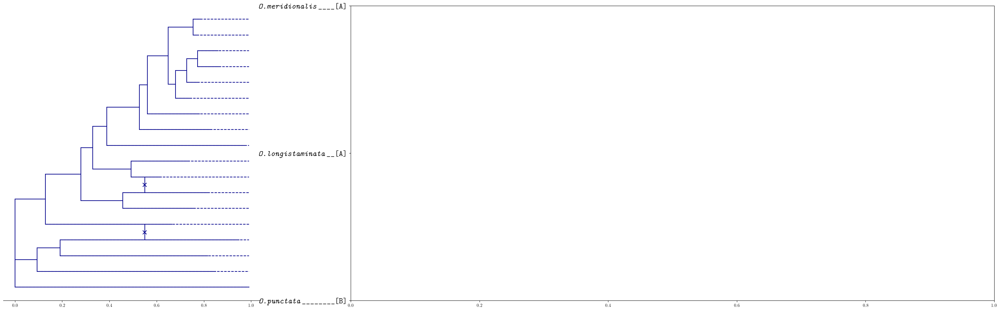

In [72]:
fig, ax = plt.subplots(nrows=1, ncols=2, gridspec_kw={'width_ratios': [1, 2.5]})#, constrained_layout=True)
fig.set_figheight(12)
fig.set_figwidth(40)
draw_clad(ot3pr)

ax[0].plot([0.55,0.55],[3,4], color = 'darkblue')
ax[0].plot([0.55,0.55],[6,7], color = 'darkblue')
ax[0].scatter([0.55-.0006],[3.5], color = 'darkblue', marker = 'x', s = 75)
ax[0].scatter([0.55-.0006],[6.5], color = 'darkblue', marker = 'x', s = 75)
#ax[0].set_title(['$\it{'+x.split('_')[1]+'}$'+'\hspace{0.8cm}'*(18-len(x))+'['+x.split('_')[0]+']' for x in t][0], size = 50)

_ = ax[1].set_yticks(range(len(t)), labels = [r'\texttt{\textit{'+x.split('_')[1]+'}'+r'_'*(20-len(x))+r'['+x.split('_')[0]+']}' for x in t], fontsize = 18)
    

In [88]:
f3 = ['$\\it{L.perrieri}$\\hspace{3cm}[OG]',
 '$\\it{O.brachyantha}$\\hspace{2cm}[F]',
 '$\\it{O.meyeriana}$\\hspace{3cm}[G]',
 '$\\it{O.coarctata}$\\hspace{2cm}[L]',
 '$\\it{O.coarctata}$\\hspace{2cm}[K]',
 '$\\it{O.australiensis}$\\hspace{3cm}[E]',
 '$\\it{O.alta}$\\hspace{4cm}[D]',
 '$\\it{O.alta}$\\hspace{4cm}[C]',
 '$\\it{O.officinalis}$\\hspace{2cm}[C]',
 '$\\it{O.punctata}$\\hspace{3cm}[B]',
 '$\\it{O.longistaminata}$\\hspace{2cm}[A]',
 '$\\it{O.meridionalis}$\\hspace{2cm}[A]',
 '$\\it{O.glumipatula}$\\hspace{2cm}[A]',
 '$\\it{O.sativa}$\\hspace{2cm}[A]',
 '$\\it{O.rufipogon}$\\hspace{2cm}[A]',
 '$\\it{O.nivara}$\\hspace{2cm}[A]',
 '$\\it{O.glaberrima}$\\hspace{2cm}[A]',
 '$\\it{O.barthii}$\\hspace{2cm}[A]']

In [86]:
f2 = ['$\it{'+x.split('_')[1]+'}$'+'\hspace{0.8cm}'+'['+x.split('_')[0]+']' for x in t]

<>:1: SyntaxWarning: invalid escape sequence '\i'
<>:1: SyntaxWarning: invalid escape sequence '\h'
<>:1: SyntaxWarning: invalid escape sequence '\i'
<>:1: SyntaxWarning: invalid escape sequence '\h'
C:\Users\cat\AppData\Local\Temp\ipykernel_32600\1081218171.py:1: SyntaxWarning: invalid escape sequence '\i'
  f2 = ['$\it{'+x.split('_')[1]+'}$'+'\hspace{0.8cm}'+'['+x.split('_')[0]+']' for x in t]
C:\Users\cat\AppData\Local\Temp\ipykernel_32600\1081218171.py:1: SyntaxWarning: invalid escape sequence '\h'
  f2 = ['$\it{'+x.split('_')[1]+'}$'+'\hspace{0.8cm}'+'['+x.split('_')[0]+']' for x in t]


In [22]:
plt.rcParams['text.usetex'] = True
plt.rcParams["font.family"] = "inconsolata"

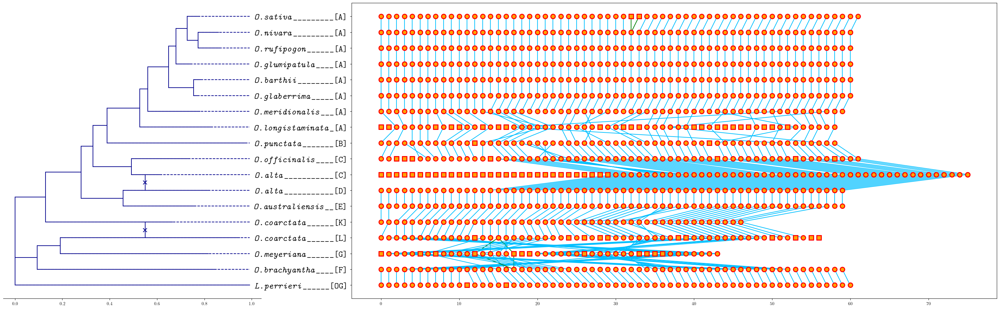

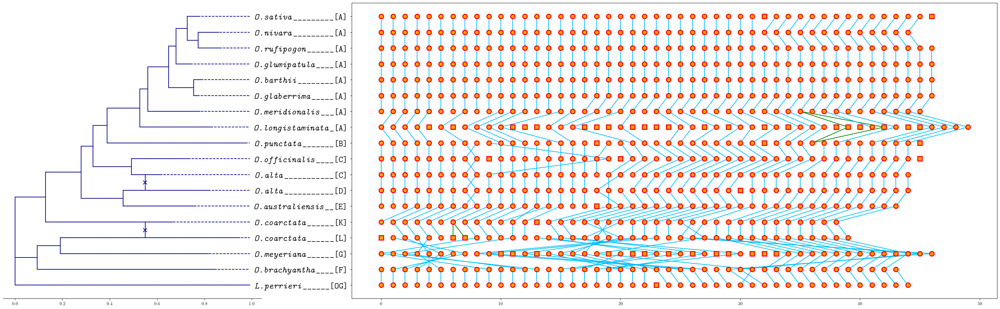

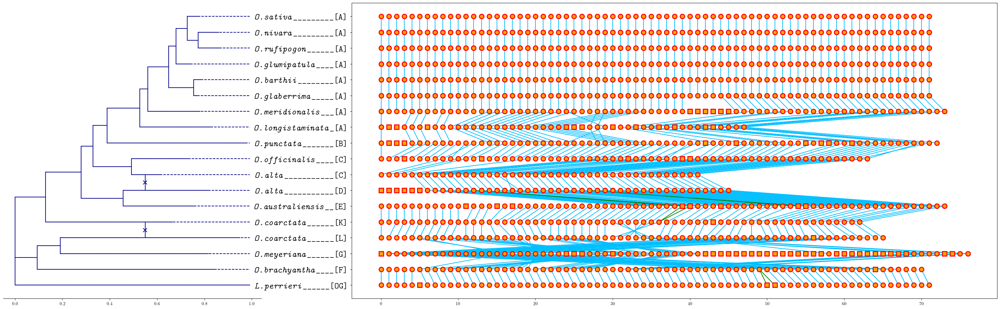

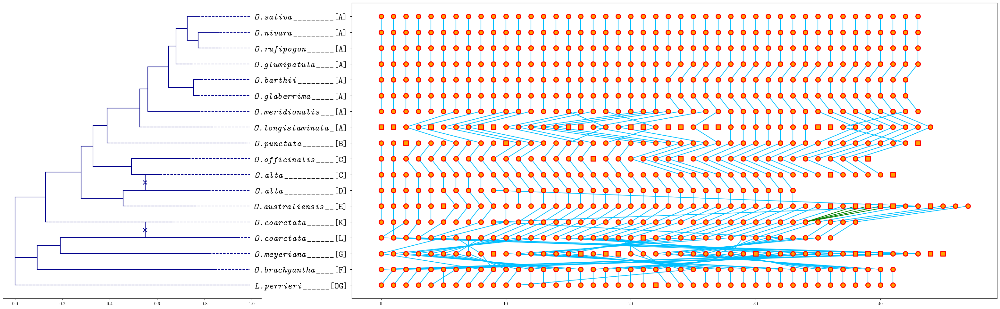

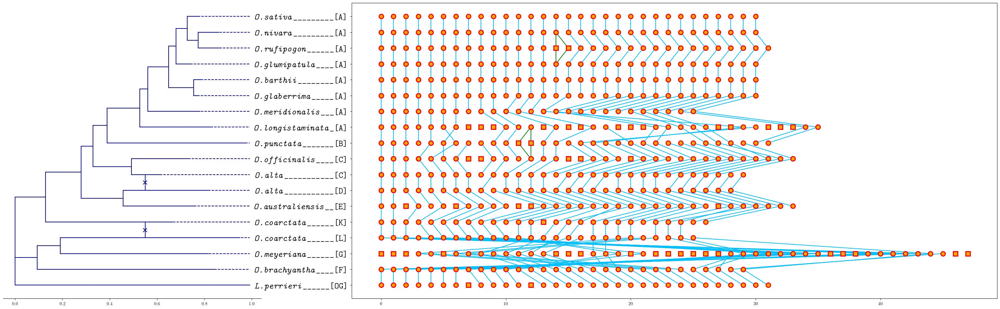

...

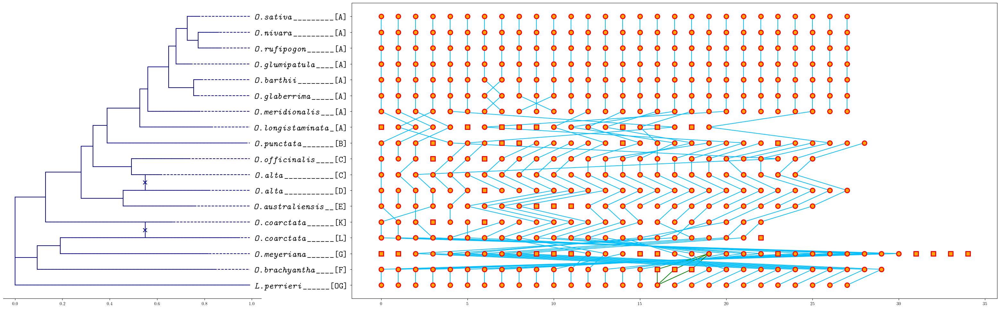

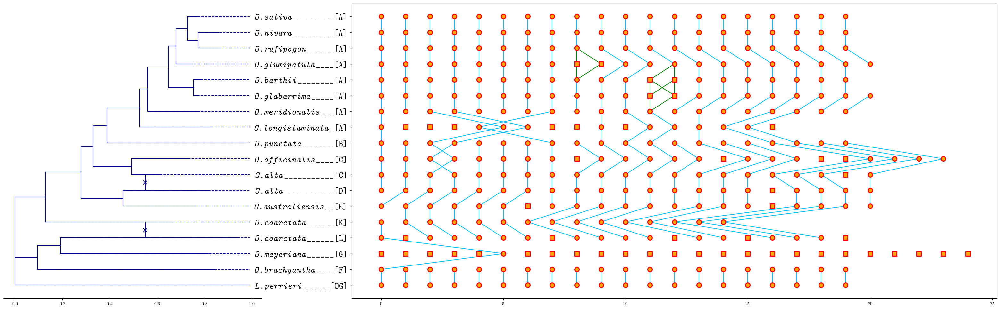

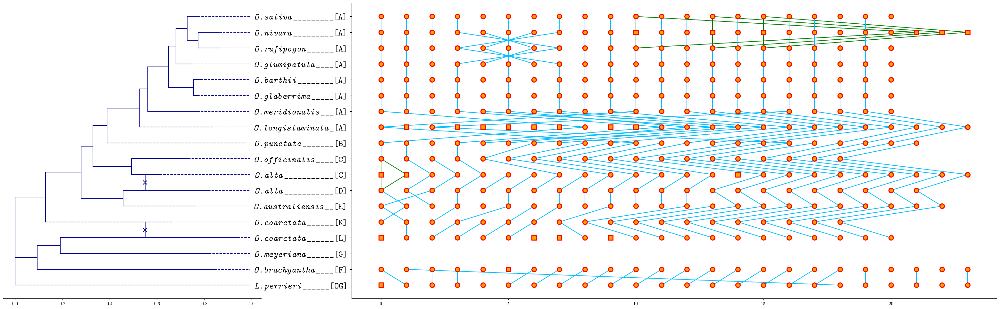

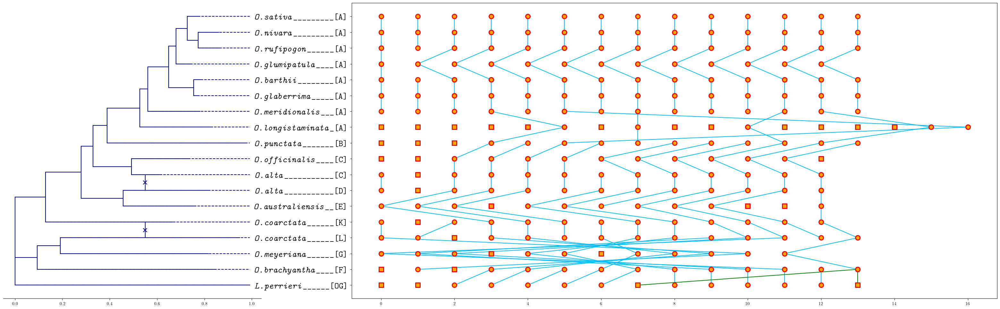

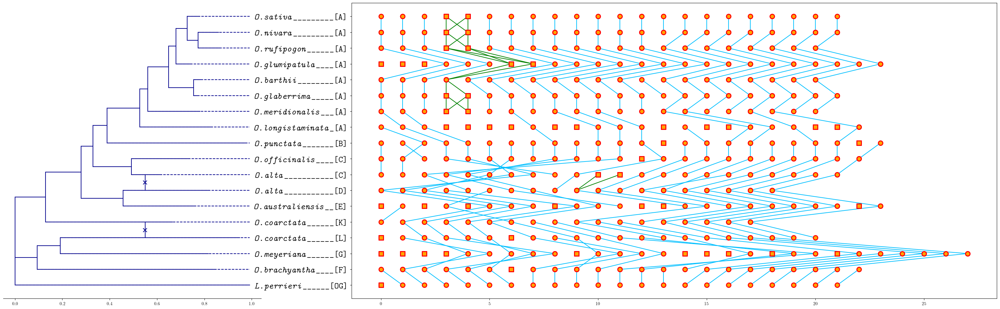

In [78]:
for ch in bn2[0].dropna().unique():
    fig, ax = plt.subplots(nrows=1, ncols=2, gridspec_kw={'width_ratios': [1, 2.5]})#, constrained_layout=True)
    fig.set_figheight(12)
    fig.set_figwidth(40)
    draw_clad(ot3pr)
    
    #link the subgenomes manually
    ax[0].plot([0.55,0.55],[3,4], color = 'darkblue')
    ax[0].plot([0.55,0.55],[6,7], color = 'darkblue')
    ax[0].scatter([0.55-.0006],[3.5], color = 'darkblue', marker = 'x', s = 75)
    ax[0].scatter([0.55-.0006],[6.5], color = 'darkblue', marker = 'x', s = 75)
    
    bc1 = bn2[bn2[0] == ch]
    
    t = []
    for i in bc1['GS'].unique():
        t = t + list(range(bc1[bc1['GS'] == i].shape[0]))
    bc1['ci'] = t
    
    t = leaves(ot3pr)
    
    col1,col2,col3,col4,col5,col6 = 'deepskyblue','orange','red','green','green','green'
    
    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    ax[1].plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    #plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    #h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            ax[1].plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            #plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1].iloc[i2],h[g2] = False,False
    
                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            ax[1].plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            #plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1],h[g2].iloc[i2] = False,False
    
                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                ax[1].plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                #plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                #h[g1].iloc[i2],h[g2].iloc[i3] = False,False
    
    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    #plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    ax[1].scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            #plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            ax[1].scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1].iloc[i2],h[g2] = False,False
    
                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            #plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            ax[1].scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1],h[g2].iloc[i2] = False,False
    
                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                #plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                ax[1].scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                h[g1].iloc[i2],h[g2].iloc[i3] = False,False
    
    
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (list(tm.index).count(g1) == 1) and h[g1]:
                ax[1].scatter(tm[g1],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            elif (list(tm.index).count(g1) > 1):
                for i2 in range(list(tm.index).count(g1)):
                    if h[g1].iloc[i2]:
                        ax[1].scatter(tm[g1].iloc[i2],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            if (list(tm.index).count(g2) == 1) and h[g2]:
                ax[1].scatter(tm[g2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)            
            elif (list(tm.index).count(g2) > 1):
                for i2 in range(list(tm.index).count(g2)):
                    if h[g2].iloc[i2]:
                        ax[1].scatter(tm[g2].iloc[i2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
    
    _ = ax[1].set_yticks(range(len(t)), labels = [r'\texttt{\textit{'+x.split('_')[1]+'}'+r'_'*(19-len(x))+r'['+x.split('_')[0]+']}' for x in t], fontsize = 20)
    #_ = ax[1].title('Oryza Chromosome ' + ch[-2:], fontsize = 22)
    
    plt.savefig('nc{0}.pdf'.format(ch[-2:]), format = 'pdf')

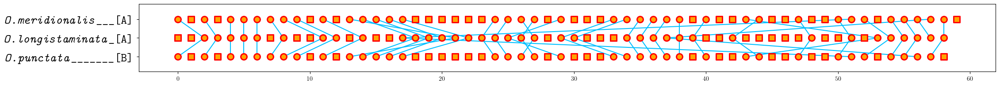

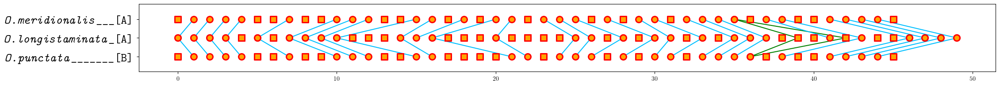

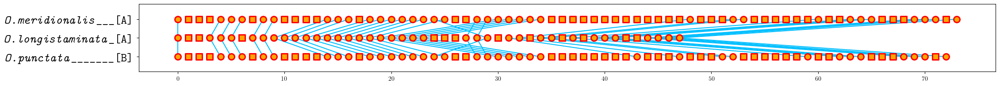

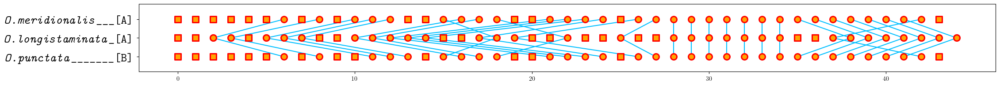

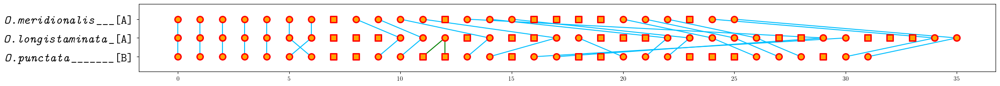

...

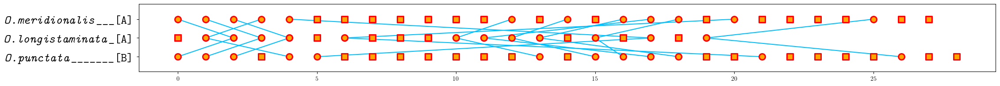

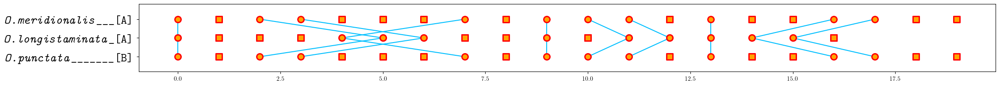

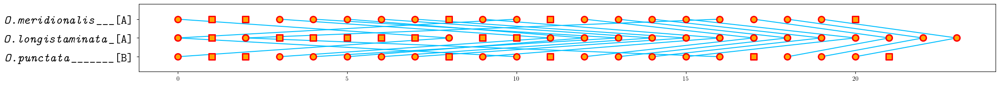

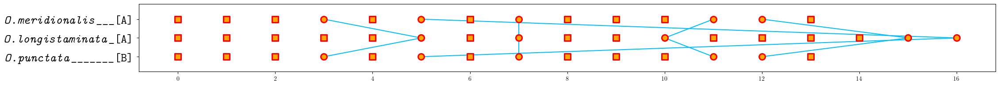

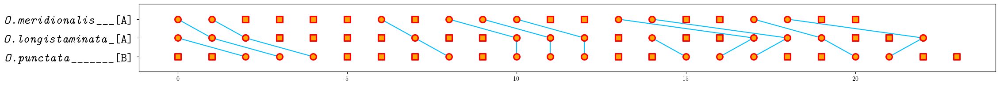

In [70]:
import warnings
warnings.filterwarnings('ignore')

for ch in bn2[0].dropna().unique():
    bc1 = bn2[bn2[0] == ch]

    t = []
    for i in bc1['GS'].unique():
        t = t + list(range(bc1[bc1['GS'] == i].shape[0]))
    bc1['ci'] = t

    t = ['B_O.punctata', 'A_O.longistaminata','A_O.meridionalis']

    from matplotlib.pyplot import figure
    figure(figsize=(25,2))
    col1,col2,col3,col4,col5,col6 = 'deepskyblue','orange','red','green','green','green'

    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    #plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    #h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            #plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1].iloc[i2],h[g2] = False,False

                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            #plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1],h[g2].iloc[i2] = False,False

                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                #plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                #h[g1].iloc[i2],h[g2].iloc[i3] = False,False

    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    #plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            #plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1].iloc[i2],h[g2] = False,False

                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            #plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1],h[g2].iloc[i2] = False,False

                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                #plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                h[g1].iloc[i2],h[g2].iloc[i3] = False,False


        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (list(tm.index).count(g1) == 1) and h[g1]:
                plt.scatter(tm[g1],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            elif (list(tm.index).count(g1) > 1):
                for i2 in range(list(tm.index).count(g1)):
                    if h[g1].iloc[i2]:
                        plt.scatter(tm[g1].iloc[i2],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            if (list(tm.index).count(g2) == 1) and h[g2]:
                plt.scatter(tm[g2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)            
            elif (list(tm.index).count(g2) > 1):
                for i2 in range(list(tm.index).count(g2)):
                    if h[g2].iloc[i2]:
                        plt.scatter(tm[g2].iloc[i2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)

    _ = plt.yticks(range(len(t)), labels = [r'\texttt{\textit{'+x.split('_')[1]+'}'+r'_'*(19-len(x))+r'['+x.split('_')[0]+']}' for x in t], fontsize = 20)
    #_ = plt.title('Oryza_full Chromosome ' + ch[-2:], fontsize = 22)

    plt.ylim(-0.8, 2.8)

    plt.savefig('lbwa{0}.pdf'.format(ch[-2:]), format = 'pdf')

In [46]:
"{}".format("GLITCH"),style="italic"

SyntaxError: invalid syntax. Maybe you meant '==' or ':=' instead of '='? (1844579845.py, line 1)

In [ ]:
['$\it{'+x.split('_')[1]+'}$'+' '*(18-len(x))+'['+x.split('_')[0]+']' for x in t]

In [45]:
['$\it{'+x.split('_')[1]+'}$'+' '*(18-len(x))+'['+x.split('_')[0]+']' for x in t]

<>:1: SyntaxWarning: invalid escape sequence '\i'
<>:1: SyntaxWarning: invalid escape sequence '\i'
C:\Users\cat\AppData\Local\Temp\ipykernel_32600\3929868093.py:1: SyntaxWarning: invalid escape sequence '\i'
  ['$\it{'+x.split('_')[1]+'}$'+' '*(18-len(x))+'['+x.split('_')[0]+']' for x in t]


['$\\it{L.perrieri}$     [OG]',
 '$\\it{O.brachyantha}$   [F]',
 '$\\it{O.meyeriana}$     [G]',
 '$\\it{O.coarctata}$     [L]',
 '$\\it{O.coarctata}$     [K]',
 '$\\it{O.australiensis}$ [E]',
 '$\\it{O.alta}$          [D]',
 '$\\it{O.alta}$          [C]',
 '$\\it{O.officinalis}$   [C]',
 '$\\it{O.punctata}$      [B]',
 '$\\it{O.longistaminata}$[A]',
 '$\\it{O.meridionalis}$  [A]',
 '$\\it{O.glumipatula}$   [A]',
 '$\\it{O.sativa}$        [A]',
 '$\\it{O.rufipogon}$     [A]',
 '$\\it{O.nivara}$        [A]',
 '$\\it{O.glaberrima}$    [A]',
 '$\\it{O.barthii}$       [A]']

C:\Users\cat\AppData\Local\Temp\ipykernel_31232\2080632229.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc1['ci'] = t
C:\Users\cat\AppData\Local\Temp\ipykernel_31232\2080632229.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc1['ci'] = t
C:\Users\cat\AppData\Local\Temp\ipykernel_31232\2080632229.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pa

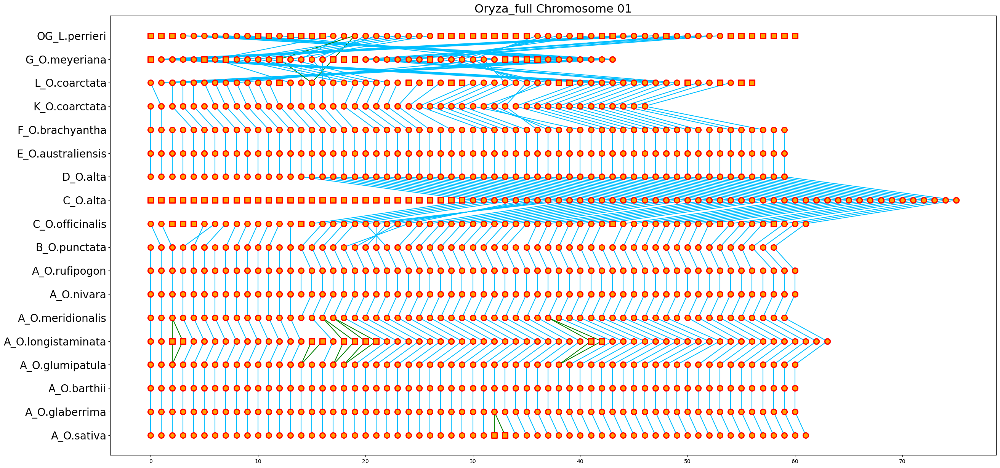

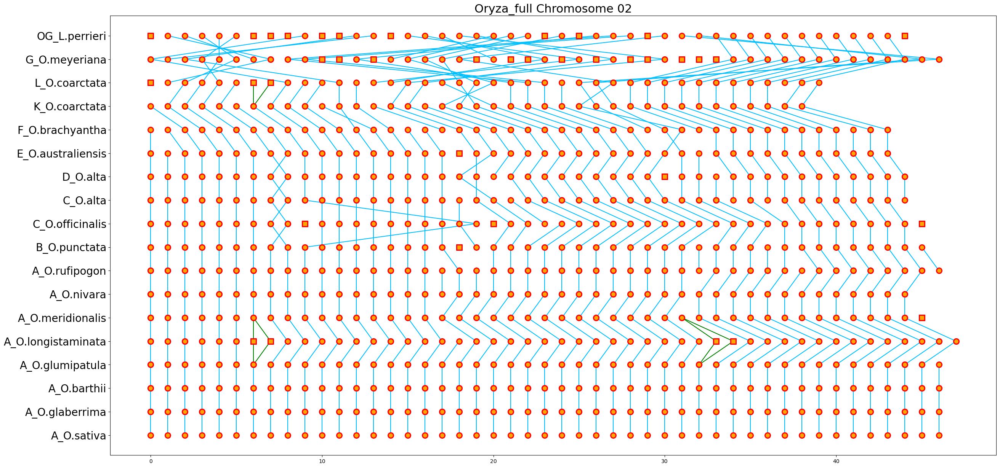

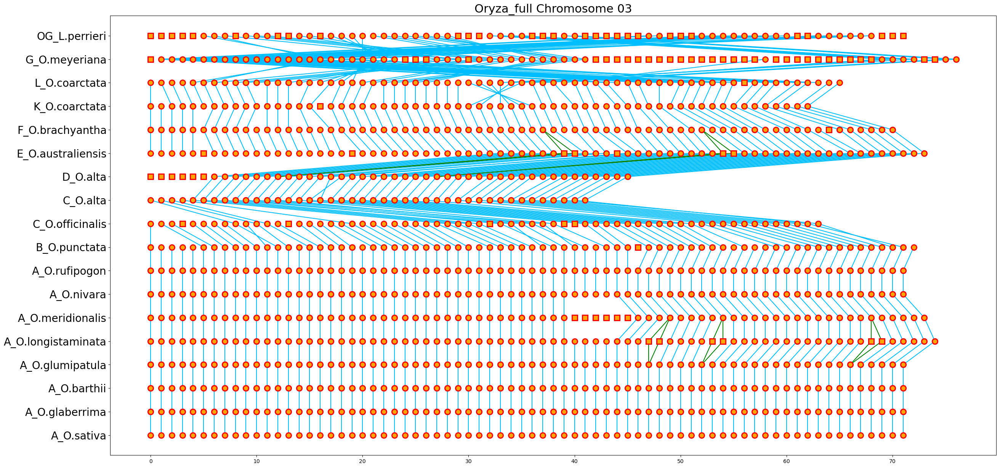

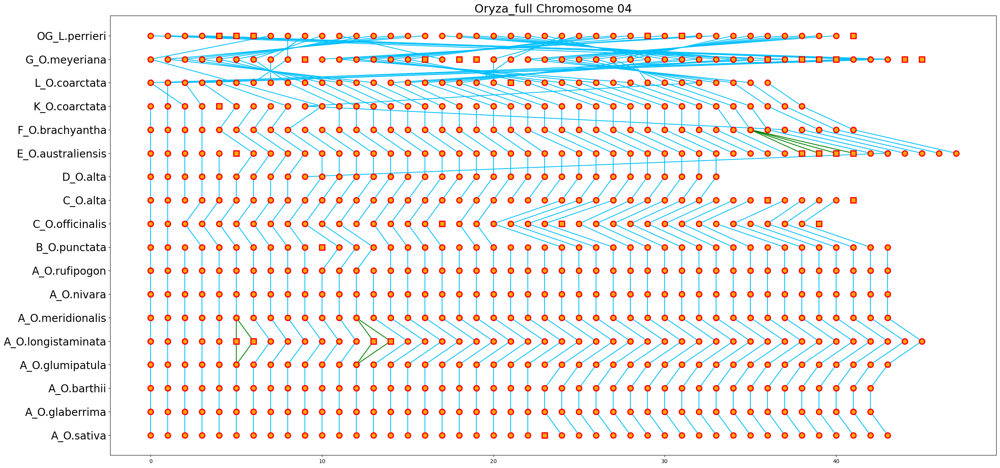

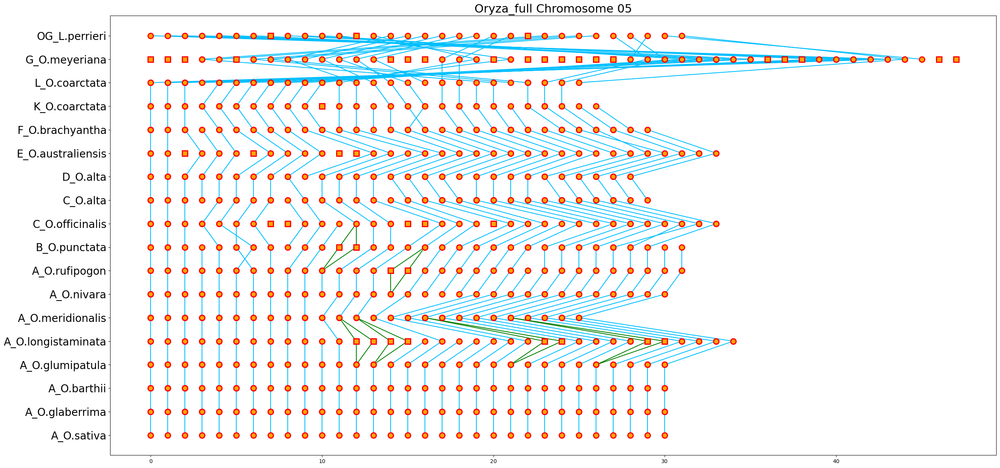

...

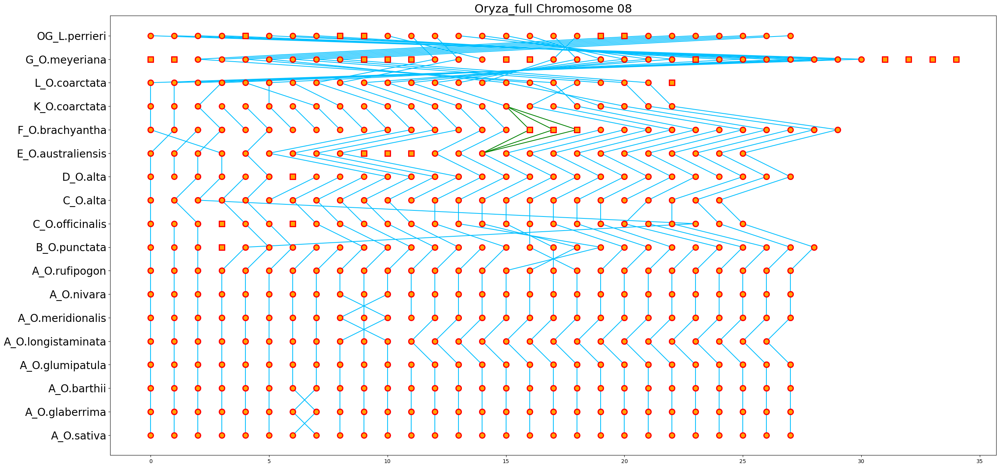

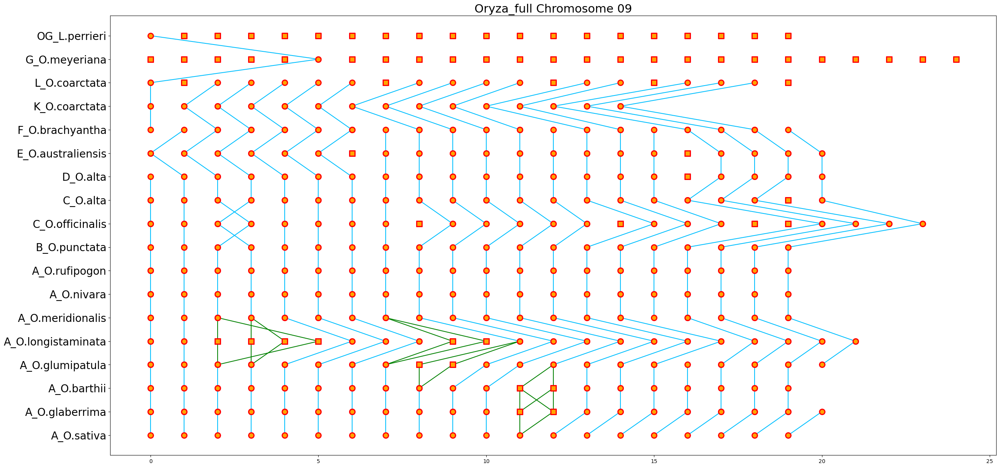

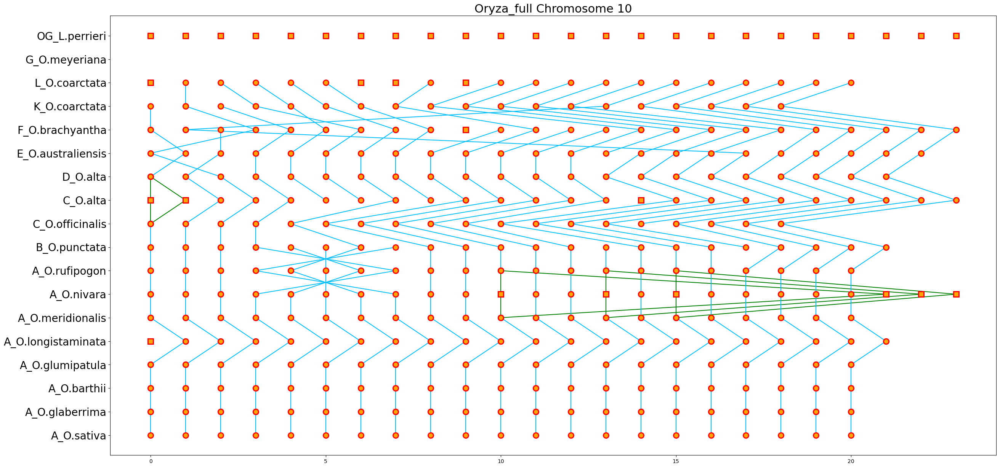

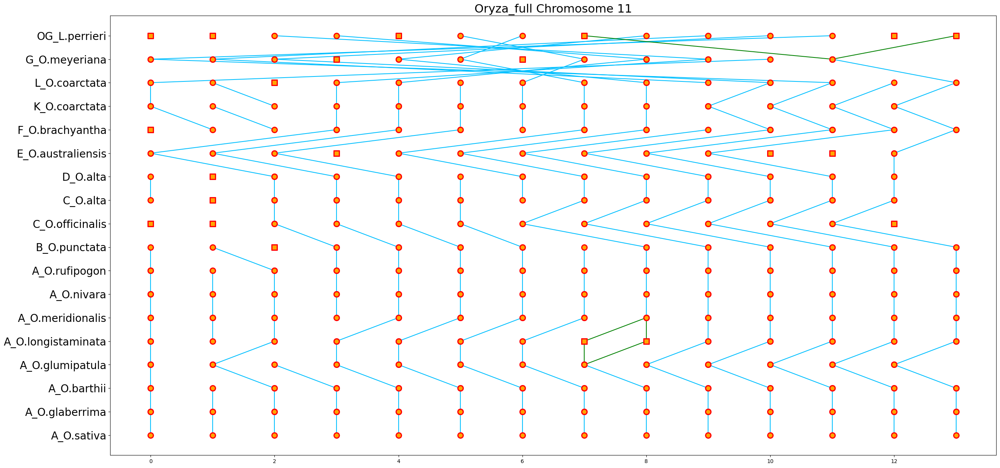

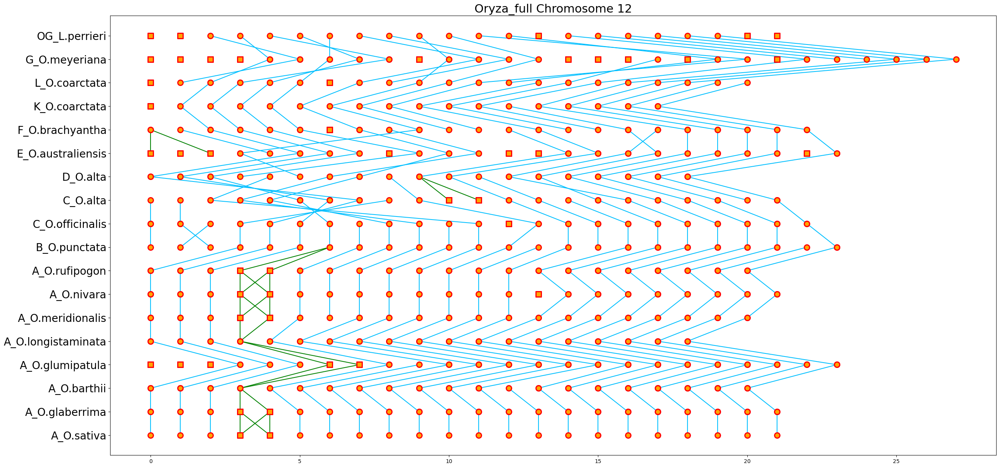

In [18]:
for ch in bn2[0].dropna().unique():
    bc1 = bn2[bn2[0] == ch]

    t = []
    for i in bc1['GS'].unique():
        t = t + list(range(bc1[bc1['GS'] == i].shape[0]))
    bc1['ci'] = t

    t = ['A_O.sativa','A_O.glaberrima','A_O.barthii','A_O.glumipatula','A_O.longistaminata','A_O.meridionalis',
        'A_O.nivara', 'A_O.rufipogon', 'B_O.punctata','C_O.officinalis','C_O.alta','D_O.alta','E_O.australiensis',
        'F_O.brachyantha', 'K_O.coarctata', 'L_O.coarctata', 'G_O.meyeriana', 'OG_L.perrieri']

    from matplotlib.pyplot import figure
    figure(figsize=(30,15))
    col1,col2,col3,col4,col5,col6 = 'deepskyblue','orange','red','green','green','green'

    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    #plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    #h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            #plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1].iloc[i2],h[g2] = False,False

                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            #plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1],h[g2].iloc[i2] = False,False

                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                #plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                #h[g1].iloc[i2],h[g2].iloc[i3] = False,False

    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    #plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            #plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1].iloc[i2],h[g2] = False,False

                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            #plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1],h[g2].iloc[i2] = False,False

                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                #plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                h[g1].iloc[i2],h[g2].iloc[i3] = False,False


        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (list(tm.index).count(g1) == 1) and h[g1]:
                plt.scatter(tm[g1],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            elif (list(tm.index).count(g1) > 1):
                for i2 in range(list(tm.index).count(g1)):
                    if h[g1].iloc[i2]:
                        plt.scatter(tm[g1].iloc[i2],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            if (list(tm.index).count(g2) == 1) and h[g2]:
                plt.scatter(tm[g2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)            
            elif (list(tm.index).count(g2) > 1):
                for i2 in range(list(tm.index).count(g2)):
                    if h[g2].iloc[i2]:
                        plt.scatter(tm[g2].iloc[i2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)

    _ = plt.yticks(range(len(t)), labels = t, fontsize = 20)
    _ = plt.title('Oryza_full Chromosome ' + ch[-2:], fontsize = 22)
    plt.savefig('fc{0}.pdf'.format(ch[-2:]), format = 'pdf')

C:\Users\cat\AppData\Local\Temp\ipykernel_32948\2279251531.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc1['ci'] = t
C:\Users\cat\AppData\Local\Temp\ipykernel_32948\2279251531.py:22: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[True, True, True, True, True, True, True, True, True, True, True, True, True, True]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  h.loc[:] = [True]*len(h)
C:\Users\cat\AppData\Local\Temp\ipykernel_32948\2279251531.py:22: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[True, True, True, True, True, True, True

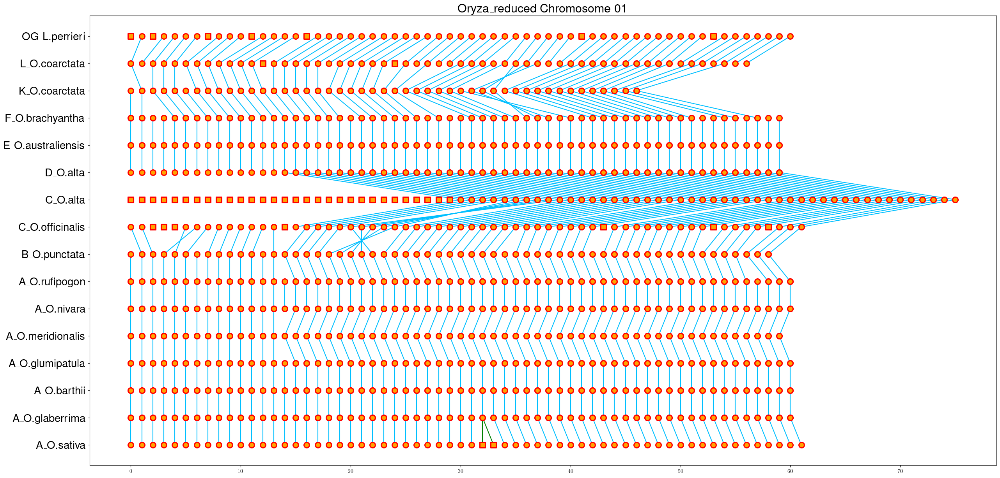

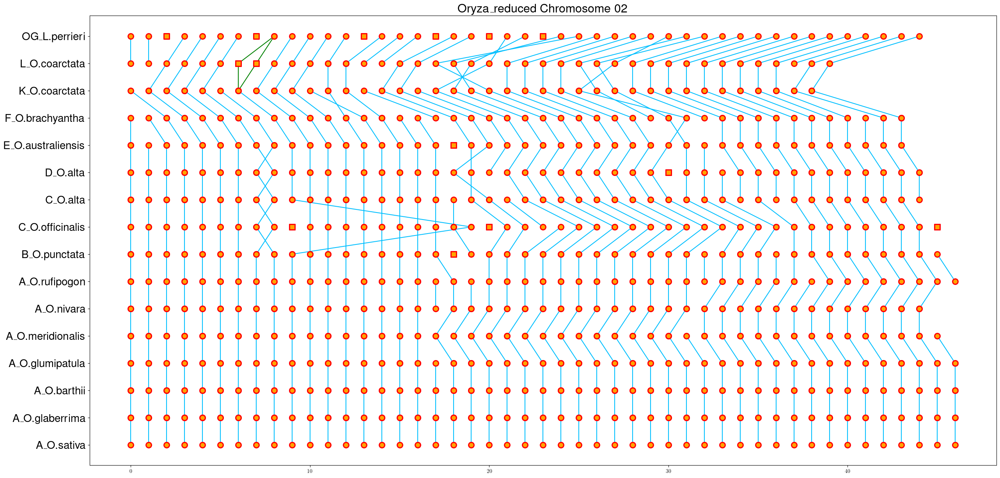

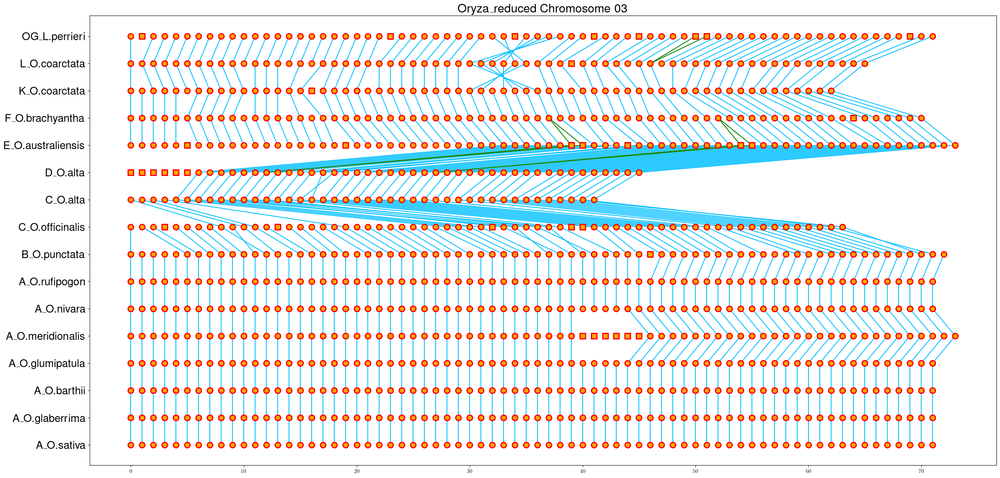

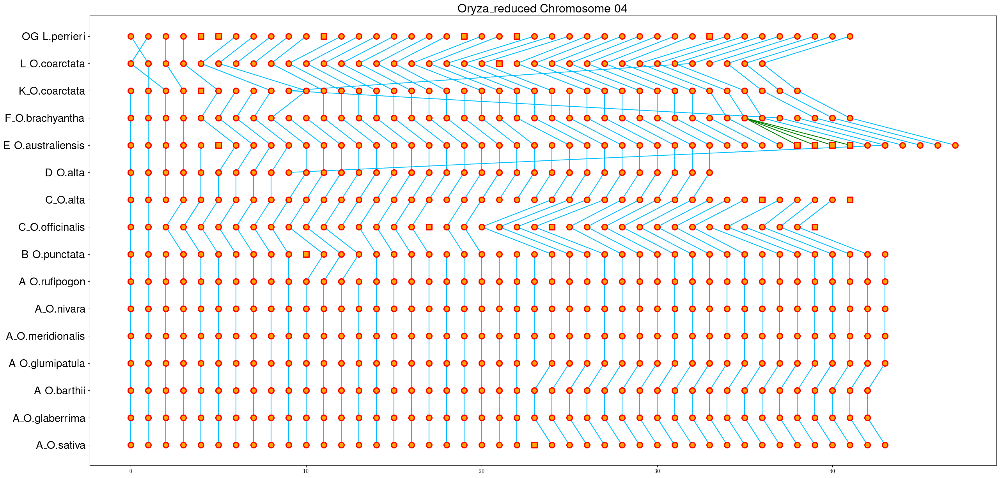

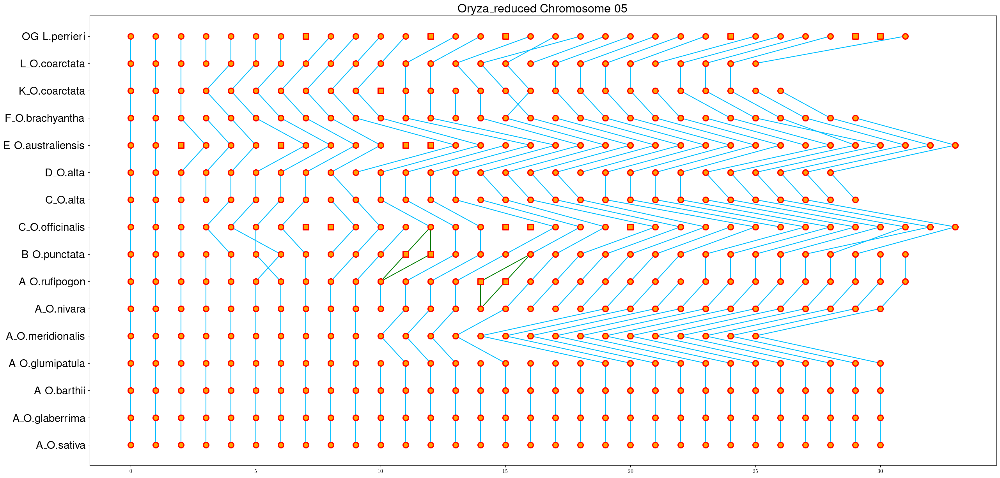

...

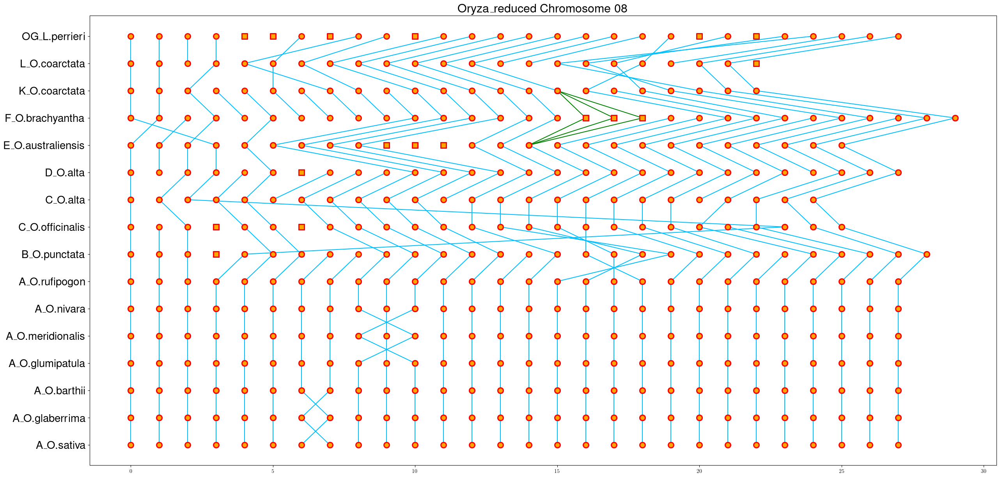

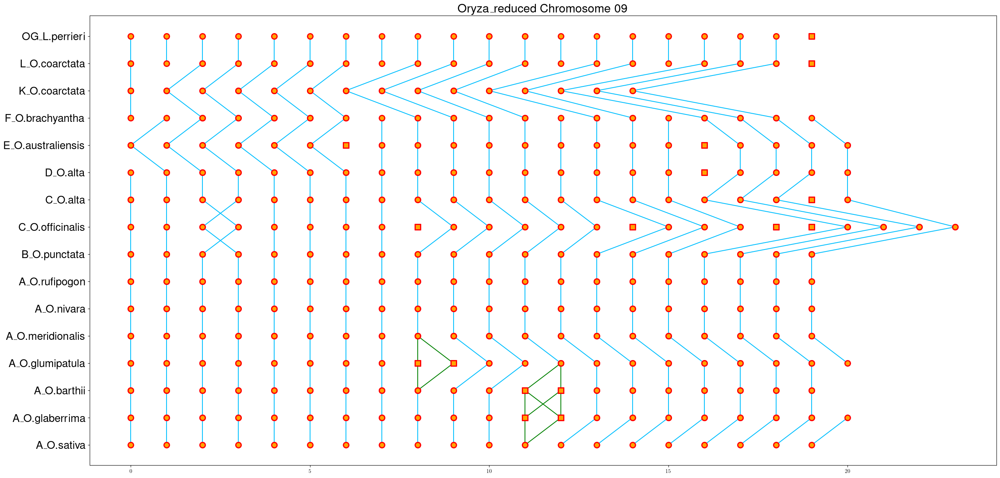

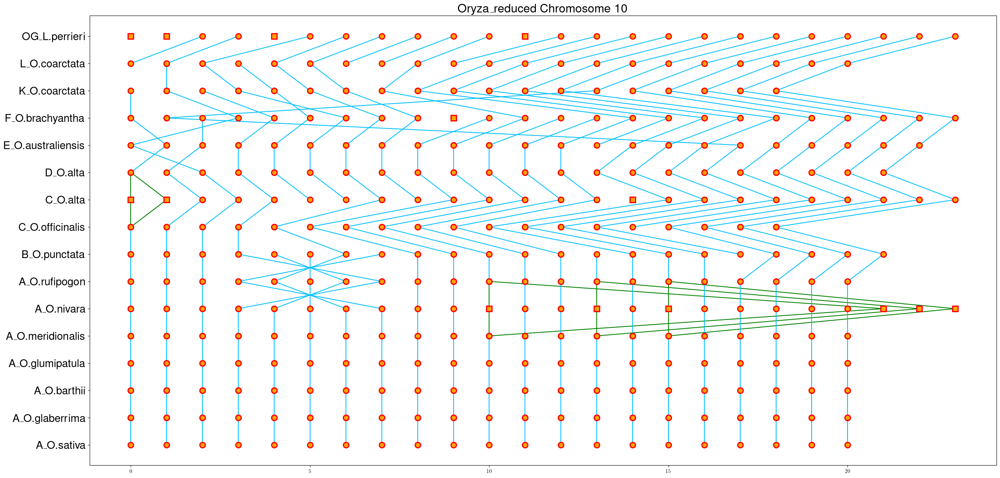

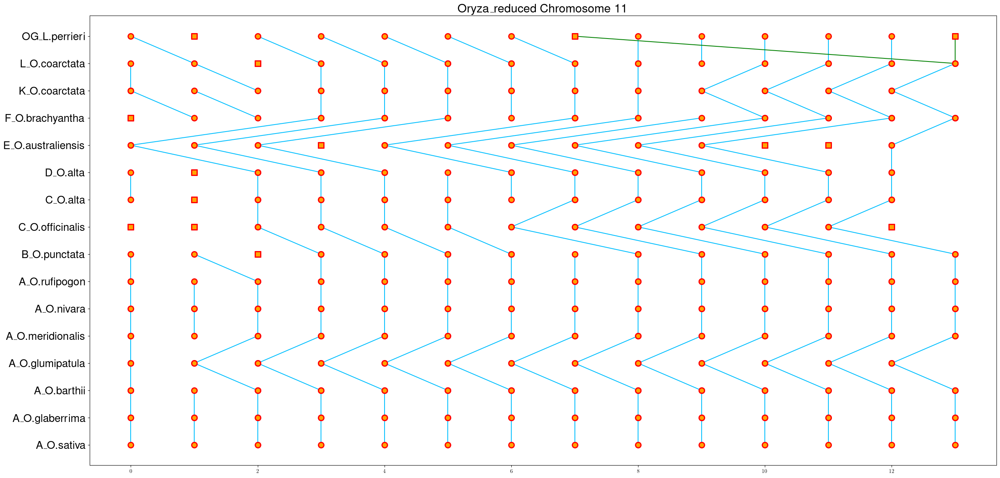

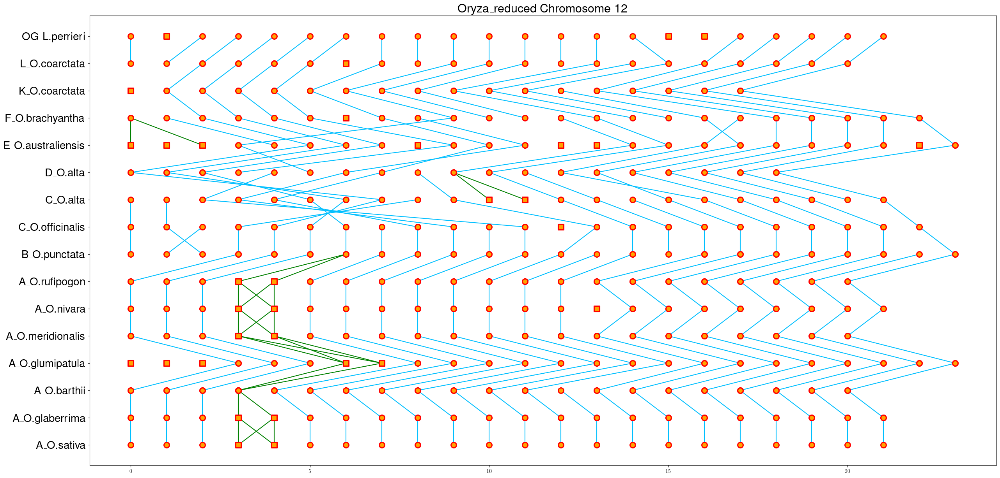

In [49]:
for ch in bn2[0].dropna().unique():
    bc1 = bn2[bn2[0] == ch]
    #bc1 = bc1[(bc1['GS'] != 'A_O.longistaminata') & (bc1['GS'] != 'G_O.meyeriana') ]

    t = []
    for i in bc1['GS'].unique():
        t = t + list(range(bc1[bc1['GS'] == i].shape[0]))
    bc1['ci'] = t

    t = ['A_O.sativa','A_O.glaberrima','A_O.barthii','A_O.glumipatula','A_O.meridionalis',
        'A_O.nivara', 'A_O.rufipogon', 'B_O.punctata','C_O.officinalis','C_O.alta','D_O.alta','E_O.australiensis',
        'F_O.brachyantha', 'K_O.coarctata', 'L_O.coarctata', 'OG_L.perrieri']

    from matplotlib.pyplot import figure
    figure(figsize=(30,15))
    col1,col2,col3,col4,col5,col6 = 'deepskyblue','orange','red','green','green','green'

    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    #plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    #h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            #plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1].iloc[i2],h[g2] = False,False

                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            #plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            #h[g1],h[g2].iloc[i2] = False,False

                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                #plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                #h[g1].iloc[i2],h[g2].iloc[i3] = False,False

    for g in bc1['gi'].unique():
        tm = bc1[bc1['gi'] == g]['ci']
        tm.index = bc1[bc1['gi'] == g]['GS']
        h = tm.copy()
        h.loc[:] = [True]*len(h)
        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (g1 in tm.index) and (g2 in tm.index):
                if (list(tm.index).count(g1) == 1) and (list(tm.index).count(g2) == 1):
                    #plt.plot([tm[g1],tm[g2]],[i,i+1], color = col1)
                    plt.scatter([tm[g1],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                    h[g1],h[g2] = False,False
                    #pass
                else:
                    if (list(tm.index).count(g1) > 1) and (list(tm.index).count(g2) <= 1):
                        for i2 in range(len(tm[g1])):
                            #plt.plot([tm[g1].iloc[i2],tm[g2]],[i,i+1], color = col4)
                            plt.scatter([tm[g1].iloc[i2],tm[g2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1].iloc[i2],h[g2] = False,False

                    elif (list(tm.index).count(g1) <= 1) and (list(tm.index).count(g2) > 1):
                        for i2 in range(len(tm[g2])):
                            #plt.plot([tm[g1],tm[g2].iloc[i2]],[i,i+1], color = col5)
                            plt.scatter([tm[g1],tm[g2].iloc[i2]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                            h[g1],h[g2].iloc[i2] = False,False

                    elif isinstance(tm[g1], pd.Series) and isinstance(tm[g2], pd.Series):
                        for i2 in range(len(tm[g1])):
                            for i3 in range(len(tm[g2])):
                                #plt.plot([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], color = col6)
                                plt.scatter([tm[g1].iloc[i2],tm[g2].iloc[i3]],[i,i+1], marker = 'o', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
                                h[g1].iloc[i2],h[g2].iloc[i3] = False,False


        for i in range(len(t) -1):
            g1,g2 = t[i],t[i+1]
            if (list(tm.index).count(g1) == 1) and h[g1]:
                plt.scatter(tm[g1],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            elif (list(tm.index).count(g1) > 1):
                for i2 in range(list(tm.index).count(g1)):
                    if h[g1].iloc[i2]:
                        plt.scatter(tm[g1].iloc[i2],i, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)
            if (list(tm.index).count(g2) == 1) and h[g2]:
                plt.scatter(tm[g2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)            
            elif (list(tm.index).count(g2) > 1):
                for i2 in range(list(tm.index).count(g2)):
                    if h[g2].iloc[i2]:
                        plt.scatter(tm[g2].iloc[i2],i+1, marker = 's', s = 100, color = col2, edgecolor = col3, linewidths=2.2, zorder = 2)

    _ = plt.yticks(range(len(t)), labels = t, fontsize = 20)
    _ = plt.title('Oryza_reduced Chromosome ' + ch[-2:], fontsize = 22)
    plt.savefig('rc{0}.pdf'.format(ch[-2:]), format = 'pdf')

In [15]:
#syndis b5

nx1 = pd.read_csv('s1/GCA_009805545.1_longistaminata/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A longistaminata
#nx2 = pd.read_csv('s1/GCA_009805545.1_longistaminata/f12.mb/viridiplantae_odb10/full_table.tsv', sep = '\t') #A longistaminata

nx2 = pd.read_csv('s1/OL/viridiplantae_odb10/full_table.tsv', sep = '\t')

In [16]:
def syndis(ref, que):
    n1 = ref['Sequence'].nunique()
    n2 = que['Sequence'].nunique()

    mx = max(n1,n2) - min(n1,n2)

    ref = ref.sort_values(['Sequence', 'fl'])
    que = que.sort_values(['Sequence', 'fl'])
    
    ref = ref.reset_index(drop = 1)
    que = que.reset_index(drop = 1)

    ref['g-1'] = ref['Gene'].shift(-1)
    que['g-1'] = que['Gene'].shift(-1)
    ref['o-1'] = ref['Strand'].shift(-1)
    que['o-1'] = que['Strand'].shift(-1)
    ref['s-1'] = ref['Sequence'].shift(-1)
    que['s-1'] = que['Sequence'].shift(-1)

    ref = ref[ref['s-1'] == ref['Sequence']]
    que = que[que['s-1'] == que['Sequence']]

    ref['gb'] = ref.apply(lambda c: str(sorted([c['Gene'], c['g-1']])) + ('f' if c['Strand'] == c['o-1'] else 'r'), axis = 1)
    que['gb'] = que.apply(lambda c: str(sorted([c['Gene'], c['g-1']])) + ('f' if c['Strand'] == c['o-1'] else 'r'), axis = 1)

    ref.loc[ref['gb'].duplicated(keep=False), 'gb'] += ref.groupby('gb').cumcount().add(1).astype(str)
    que.loc[que['gb'].duplicated(keep=False), 'gb'] += que.groupby('gb').cumcount().add(1).astype(str)

    n = len(set(ref['gb']).intersection(set(que['gb']))) / (len(set(ref['gb']).union(set(que['gb']))) - mx)
    
    return n

In [17]:
nx1 = nx1[nx1['Status'].isin(['Single','Duplicated'])]
nx2 = nx2[nx2['Status'].isin(['Single','Duplicated'])]
nx1['fl'] = nx1.apply(lambda c: min(c['Gene Start'], c['Gene End']), axis = 1)
nx2['fl'] = nx2.apply(lambda c: min(c['Gene Start'], c['Gene End']), axis = 1)

In [18]:
1 - syndis(nx1,nx2)

0.8225584594222833

In [ ]:
#spare

In [30]:
gh = pd.read_csv('../meta/mcomp.tsv', sep = '\t')

C:\Users\cat\AppData\Local\Temp\ipykernel_31232\1936055397.py:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  gh = pd.read_csv('../meta/mcomp.tsv', sep = '\t')


In [31]:
gh

,#Organism Name,Organism Groups,Strain,BioSample,BioProject,Assembly,NumLev,Level,Size(Mb),GC%,...,L90,False_single,False_duplicated,False_hits,MPH,Assembly_level,Ploidy,Ploidy_type,Inflation,Lineage
0,Saccharum officinarum,Eukaryota;Plants;Land Plants,NaN,SAMN20080868,PRJNA744175,GCA_020631735.1,2,Chromosome,6804.8900,44.5812,...,73.0,109.0,121.0,230.0,315831,8.0,8.0,Allo,6.534118,viridiplantae
1,Diospyros kaki,Eukaryota;Plants;Land Plants,NaN,SAMN26302294,PRJNA810977,GCA_028777405.1,2,Chromosome,4500.5300,36.6910,...,90.0,60.0,38.0,98.0,262446,6.0,6.0,Allo,5.745283,viridiplantae
2,Cardamine occulta,Eukaryota;Plants;Land Plants,ZGX-2022,SAMN28868940,PRJNA846126,GCA_028015245.1,2,Chromosome,683.9850,35.4213,...,28.0,139.0,37.0,176.0,164675,4.0,8.0,Allo,3.549528,viridiplantae
3,Fragaria Xananassa,Eukaryota;Plants;Land Plants,NaN,SAMN16094694,PRJNA662854,GCA_019022445.1,2,Chromosome,805.6800,39.3464,...,26.0,127.0,39.0,166.0,155378,4.0,8.0,Allo,3.343602,viridiplantae
4,Cyclocarya paliurus,Eukaryota;Plants;Land Plants,4PA2023,SAMN33247649,PRJNA933771,GCA_029856945.1,2,Chromosome,2383.5300,36.7484,...,64.0,133.0,53.0,186.0,180073,4.0,4.0,Auto,3.698113,viridiplantae
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21227,Dianesia carteri,Eukaryota;Animals;Insects,NaN,SAMN12776979,PRJNA606954,GCA_018237465.1,4,Contig,16.5535,35.2000,...,48402.0,NaN,NaN,NaN,12350,NaN,NaN,NaN,NaN,arthropoda
21228,Sarangesa brigida,Eukaryota;Animals;Insects,NaN,SAMN11893865,PRJNA606954,GCA_018246035.1,4,Contig,16.2700,35.7000,...,46675.0,NaN,NaN,NaN,10021,NaN,NaN,NaN,NaN,arthropoda
21229,Mysoria affinis,Eukaryota;Animals;Insects,NaN,SAMN11893109,PRJNA606954,GCA_018246815.1,4,Contig,15.0098,41.5000,...,44310.0,NaN,NaN,NaN,19232,NaN,NaN,NaN,NaN,arthropoda
21230,Emesis vulpina,Eukaryota;Animals;Insects,NaN,SAMN12776955,PRJNA606954,GCA_018237085.1,4,Contig,13.9891,34.7000,...,39450.0,NaN,NaN,NaN,8526,NaN,NaN,NaN,NaN,arthropoda


In [26]:
gh['LogSize'] = np.log(gh['Size'])

In [19]:
gh.columns

Index(['#Organism Name', 'Organism Groups', 'Strain', 'BioSample',
       'BioProject', 'Assembly', 'NumLev', 'Level', 'Size(Mb)', 'GC%',
       'Replicons', 'WGS', 'Scaffolds', 'CDS', 'RDate', 'Release Date',
       'GenBank FTP', 'RefSeq FTP', 'onn', 'on', 'genus', 'phylum', 'class',
       'order', 'family', 'Single USCO', 'Duplicated USCO', 'File', 'Size',
       'Contigs', 'Mean', 'Longest', 'Shortest', 'N_count', 'Gaps', 'N50',
       'L50', 'N70', 'L70', 'N90', 'L90', 'False_single', 'False_duplicated',
       'False_hits', 'MPH', 'Assembly_level', 'Ploidy', 'Ploidy_type',
       'Inflation', 'Lineage', 'LogSize'],
      dtype='object')